In [1]:
# 기존의 kitti object dataset과 함께, Depth의 결과값도 저장

# get images

!wget 'https://s3.eu-central-1.amazonaws.com/avg-kitti/data_object_image_2.zip'  
!unzip 'data_object_image_2.zip'

# get annotations

!wget 'https://s3.eu-central-1.amazonaws.com/avg-kitti/data_object_label_2.zip'  
!unzip 'data_object_label_2.zip'

# GLPN Model (Use transformers Module)
https://huggingface.co/docs/transformers/main/model_doc/glpn  

!pip install git+https://github.com/huggingface/transformers  

In [2]:
# 1. Import Module
import os, sys
import random
#import itertools
#import io
#import math
import pandas as pd
import numpy as np
import numpy
#import seaborn as sns
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import cv2
import pandas as pd
from tqdm import tqdm

from torchvision import datasets, transforms
from transformers import GLPNForDepthEstimation, GLPNFeatureExtractor
from transformers import DetrFeatureExtractor, DetrForObjectDetection
from PIL import Image

In [132]:
df = pd.read_csv('./annotations.csv')
print(len(df)) # 40570 data
df.head(20)

40570


,filename,class,truncated,occluded,observation angle,xmin,ymin,xmax,ymax,height,width,length,xloc,yloc,zloc,rot_y
0,000000.txt,Pedestrian,0.00,0,-0.20,712.40,143.00,810.73,307.92,1.89,0.48,1.20,1.84,1.47,8.41,0.01
1,000001.txt,Truck,0.00,0,-1.57,599.41,156.40,629.75,189.25,2.85,2.63,12.34,0.47,1.49,69.44,-1.56
2,000001.txt,Car,0.00,0,1.85,387.63,181.54,423.81,203.12,1.67,1.87,3.69,-16.53,2.39,58.49,1.57
3,000001.txt,Cyclist,0.00,3,-1.65,676.60,163.95,688.98,193.93,1.86,0.60,2.02,4.59,1.32,45.84,-1.55
4,000002.txt,Misc,0.00,0,-1.82,804.79,167.34,995.43,327.94,1.63,1.48,2.37,3.23,1.59,8.55,-1.47
5,000002.txt,Car,0.00,0,-1.67,657.39,190.13,700.07,223.39,1.41,1.58,4.36,3.18,2.27,34.38,-1.58
6,000003.txt,Car,0.00,0,1.55,614.24,181.78,727.31,284.77,1.57,1.73,4.15,1.00,1.75,13.22,1.62
7,000004.txt,Car,0.00,0,1.96,280.38,185.10,344.90,215.59,1.49,1.76,4.01,-15.71,2.16,38.26,1.57
8,000004.txt,Car,0.00,0,1.88,365.14,184.54,406.11,205.20,1.38,1.80,3.41,-15.89,2.23,51.17,1.58
9,000005.txt,Pedestrian,0.00,0,1.94,330.06,178.74,360.77,238.64,1.87,0.96,0.65,-8.50,2.07,23.02,1.59


In [4]:
df.filename = [f.replace('txt', 'png') for f in df.filename] # .txt -> .png

In [5]:
df['class'].unique() # 8개

array(['Pedestrian', 'Truck', 'Car', 'Cyclist', 'Misc', 'Van', 'Tram',
       'Person_sitting'], dtype=object)

In [6]:
# train, validation, test set으로 구분하기
df_train = df.iloc[:28399]
df_valid = df.iloc[28399:36513]
df_test = df.iloc[36513:]
 
print(len(df_train)) # 28399 // 0.7
print(len(df_valid)) # 8114 // 0.2
print(len(df_test)) # 4057 // 0.1

28399
8114
4057


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40570 entries, 0 to 40569
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   filename           40570 non-null  object 
 1   class              40570 non-null  object 
 2   truncated          40570 non-null  float64
 3   occluded           40570 non-null  int64  
 4   observation angle  40570 non-null  float64
 5   xmin               40570 non-null  float64
 6   ymin               40570 non-null  float64
 7   xmax               40570 non-null  float64
 8   ymax               40570 non-null  float64
 9   height             40570 non-null  float64
 10  width              40570 non-null  float64
 11  length             40570 non-null  float64
 12  xloc               40570 non-null  float64
 13  yloc               40570 non-null  float64
 14  zloc               40570 non-null  float64
 15  rot_y              40570 non-null  float64
dtypes: float64(13), int64(

In [8]:
df.head(5)

,filename,class,truncated,occluded,observation angle,xmin,ymin,xmax,ymax,height,width,length,xloc,yloc,zloc,rot_y
0,000000.png,Pedestrian,0.0,0,-0.20,712.40,143.00,810.73,307.92,1.89,0.48,1.20,1.84,1.47,8.41,0.01
1,000001.png,Truck,0.0,0,-1.57,599.41,156.40,629.75,189.25,2.85,2.63,12.34,0.47,1.49,69.44,-1.56
2,000001.png,Car,0.0,0,1.85,387.63,181.54,423.81,203.12,1.67,1.87,3.69,-16.53,2.39,58.49,1.57
3,000001.png,Cyclist,0.0,3,-1.65,676.60,163.95,688.98,193.93,1.86,0.60,2.02,4.59,1.32,45.84,-1.55
4,000002.png,Misc,0.0,0,-1.82,804.79,167.34,995.43,327.94,1.63,1.48,2.37,3.23,1.59,8.55,-1.47


In [9]:
# 이미지 파일 개수
train_image_list = os.listdir('./data/image/train') # 40570
len(train_image_list) # 7481

7481

In [10]:
# 모델 불러오기
# COCO classes (91개)
CLASSES = [
    'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A',
    'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack',
    'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis',
    'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
    'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich',
    'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake',
    'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table', 'N/A',
    'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
    'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A',
    'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
    'toothbrush'
]

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

# 3. Preprocessing and bounding box
# standard PyTorch mean-std input image normalization
dpt_transform = transforms.Compose([
    #transforms.Resize(800),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

# 4. Detection
def detect(im, model, transform):
    # mean-std normalize the input image (batch-size: 1)
    img = transform(im).unsqueeze(0)
    img_shape = img.shape

    # demo model only support by default images with aspect ratio between 0.5 and 2
    # if you want to use images with an aspect ratio outside this range
    # rescale your image so that the maximum size is at most 1333 for best results
    assert img.shape[-2] <= 1600 and img.shape[-1] <= 1600, 'demo model only supports images up to 1600 pixels on each side'

    # propagate through the model
    outputs = model(img)

    # keep only predictions with 0.7+ confidence
    probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
    keep = probas.max(-1).values > 0.7

    # convert boxes from [0; 1] to image scales
    bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)
    return probas[keep], bboxes_scaled, img_shape

detr_101 = torch.hub.load('facebookresearch/detr:main', 'detr_resnet101', pretrained=True) # Use resnet 101
detr_101.eval()

Using cache found in C:\Users\Admin/.cache\torch\hub\facebookresearch_detr_main


DETR(
  (transformer): Transformer(
    (encoder): TransformerEncoder(
      (layers): ModuleList(
        (0): TransformerEncoderLayer(
          (self_attn): MultiheadAttention(
            (out_proj): _LinearWithBias(in_features=256, out_features=256, bias=True)
          )
          (linear1): Linear(in_features=256, out_features=2048, bias=True)
          (dropout): Dropout(p=0.1, inplace=False)
          (linear2): Linear(in_features=2048, out_features=256, bias=True)
          (norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
          (norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
          (dropout1): Dropout(p=0.1, inplace=False)
          (dropout2): Dropout(p=0.1, inplace=False)
        )
        (1): TransformerEncoderLayer(
          (self_attn): MultiheadAttention(
            (out_proj): _LinearWithBias(in_features=256, out_features=256, bias=True)
          )
          (linear1): Linear(in_features=256, out_features=2048, bias=True)
       

In [11]:
# DETR의 Object Detection과 실제 좌표 위치 비교

In [12]:
train_image_list[10] # 10번째 png

'000010.png'

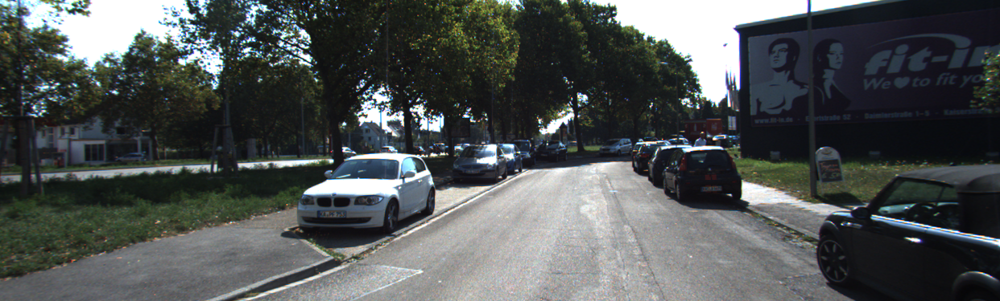

In [13]:
img1 = Image.open(os.path.join('./data/image/train/',train_image_list[10]))
img1

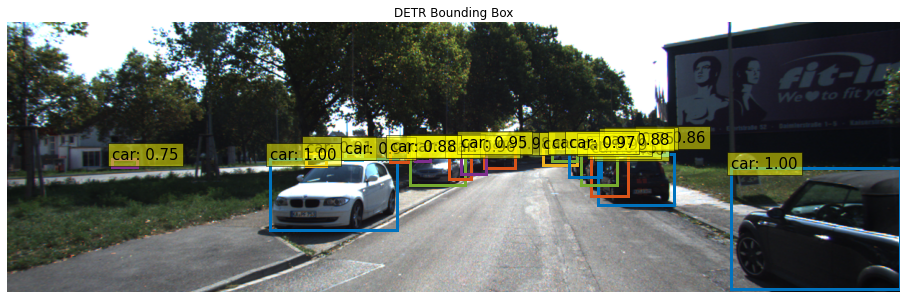

In [14]:
# DETR 예측값
scores, boxes, shape = detect(img1, detr_101, dpt_transform)

# 시각화 (특정 부분만)
def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.title('DETR Bounding Box')
    plt.show()
    
plot_results(img1, scores, boxes)

In [15]:
# 실제 이미지의 LABEL
df_choose = df.loc[df.filename==train_image_list[10]]
df_choose

,filename,class,truncated,occluded,observation angle,xmin,ymin,xmax,ymax,height,width,length,xloc,yloc,zloc,rot_y
27,000010.png,Car,0.8,0,-2.09,1013.39,182.46,1241.00,374.00,1.57,1.65,3.35,4.43,1.65,5.20,-1.42
28,000010.png,Car,0.0,0,1.95,354.43,185.52,549.52,294.49,1.43,1.70,3.95,-2.39,1.66,11.80,1.76
29,000010.png,Pedestrian,0.0,2,1.41,859.54,159.80,879.68,221.40,1.96,0.72,1.09,8.33,1.55,23.51,1.75
30,000010.png,Car,0.0,0,-1.78,819.63,178.12,926.85,251.56,1.51,1.60,3.24,5.85,1.64,16.50,-1.44
31,000010.png,Car,0.0,2,-1.69,800.54,178.06,878.75,230.56,1.45,1.74,4.10,6.87,1.62,22.05,-1.39
32,000010.png,Car,0.0,0,1.80,558.55,179.04,635.05,230.61,1.54,1.68,3.79,-0.38,1.76,23.64,1.78
33,000010.png,Car,0.0,2,1.77,598.30,178.68,652.25,218.17,1.49,1.52,3.35,0.64,1.74,29.07,1.79
34,000010.png,Car,0.0,1,-1.67,784.59,178.04,839.98,220.10,1.53,1.65,4.37,7.88,1.75,28.53,-1.40
35,000010.png,Car,0.0,1,1.92,663.74,175.36,707.21,204.15,1.64,1.45,3.48,4.50,1.80,42.85,2.02


In [16]:
class_list = df_choose[['class']].values
class_list

array([['Car'],
       ['Car'],
       ['Pedestrian'],
       ['Car'],
       ['Car'],
       ['Car'],
       ['Car'],
       ['Car'],
       ['Car']], dtype=object)

In [17]:
coordinates = df_choose[['xmin','ymin','xmax','ymax']].values
coordinates

array([[1013.39,  182.46, 1241.  ,  374.  ],
       [ 354.43,  185.52,  549.52,  294.49],
       [ 859.54,  159.8 ,  879.68,  221.4 ],
       [ 819.63,  178.12,  926.85,  251.56],
       [ 800.54,  178.06,  878.75,  230.56],
       [ 558.55,  179.04,  635.05,  230.61],
       [ 598.3 ,  178.68,  652.25,  218.17],
       [ 784.59,  178.04,  839.98,  220.1 ],
       [ 663.74,  175.36,  707.21,  204.15]])

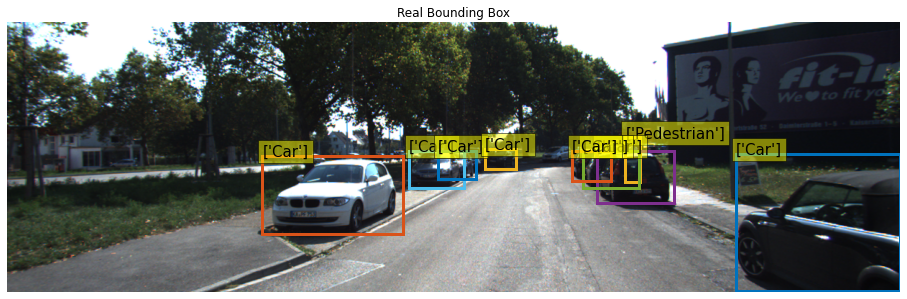

In [18]:
# 시각화 (특정 부분만)
def plot_results0(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        #cl = p.argmax()
        text = p
        ax.text(xmin, ymin, p, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.title('Real Bounding Box')
    plt.show()

plot_results0(img1, class_list, coordinates)

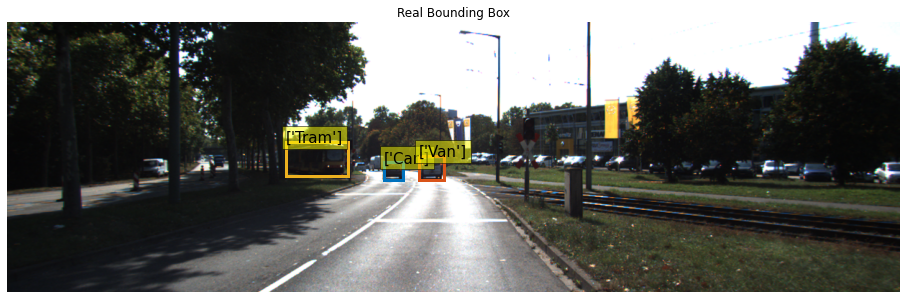

In [19]:
img2 = Image.open(os.path.join('./data/image/train/',train_image_list[18]))
df_choose = df.loc[df.filename==train_image_list[18]]
class_list = df_choose[['class']].values
coordinates = df_choose[['xmin','ymin','xmax','ymax']].values

# 시각화 (특정 부분만)
def plot_results0(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        #cl = p.argmax()
        text = p
        ax.text(xmin, ymin, p, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.title('Real Bounding Box')
    plt.show()

plot_results0(img2, class_list, coordinates)

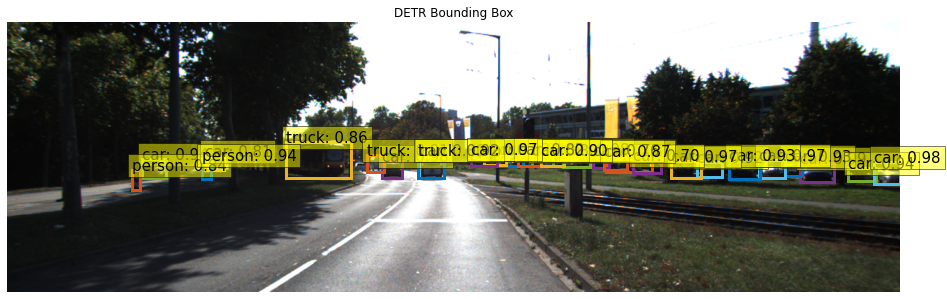

In [20]:
# DETR 예측값
scores, boxes, shape = detect(img2, detr_101, dpt_transform)

# 시각화 (특정 부분만)
def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.title('DETR Bounding Box')
    plt.show()
    
plot_results(img2, scores, boxes)

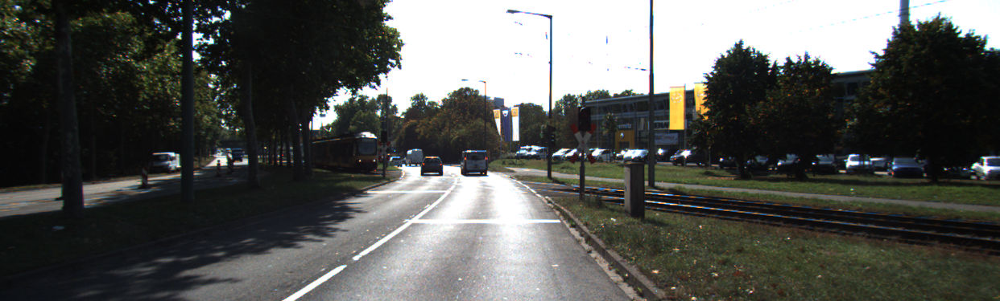

In [21]:
img2

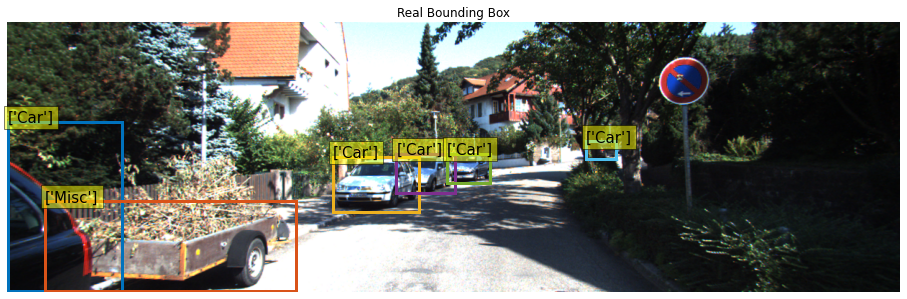

In [22]:
img3 = Image.open(os.path.join('./data/image/train/',train_image_list[75]))
df_choose = df.loc[df.filename==train_image_list[75]]
class_list = df_choose[['class']].values
coordinates = df_choose[['xmin','ymin','xmax','ymax']].values


# 시각화 (특정 부분만)
def plot_results0(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        #cl = p.argmax()
        text = p
        ax.text(xmin, ymin, p, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.title('Real Bounding Box')
    plt.show()

plot_results0(img3, class_list, coordinates)

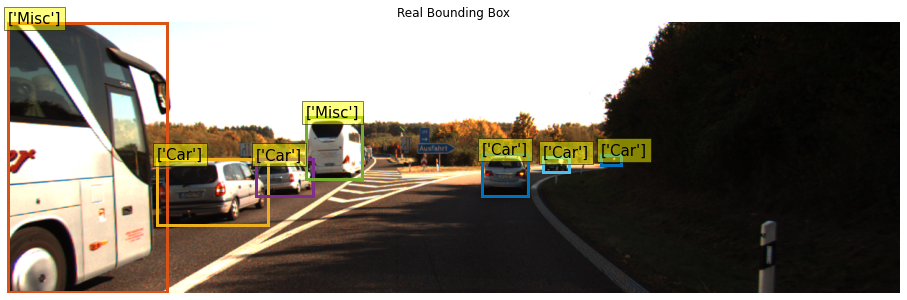

In [23]:
img4 = Image.open(os.path.join('./data/image/train/',train_image_list[98]))
df_choose = df.loc[df.filename==train_image_list[98]]
class_list = df_choose[['class']].values
coordinates = df_choose[['xmin','ymin','xmax','ymax']].values


# 시각화 (특정 부분만)
def plot_results0(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        #cl = p.argmax()
        text = p
        ax.text(xmin, ymin, p, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.title('Real Bounding Box')
    plt.show()

plot_results0(img4, class_list, coordinates)

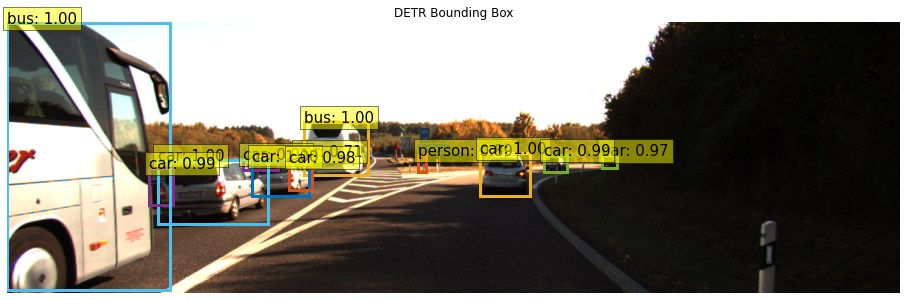

In [24]:
# DETR 예측값
scores, boxes, shape = detect(img4, detr_101, dpt_transform)

# 시각화 (특정 부분만)
def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.title('DETR Bounding Box')
    plt.show()
    
plot_results(img4, scores, boxes)

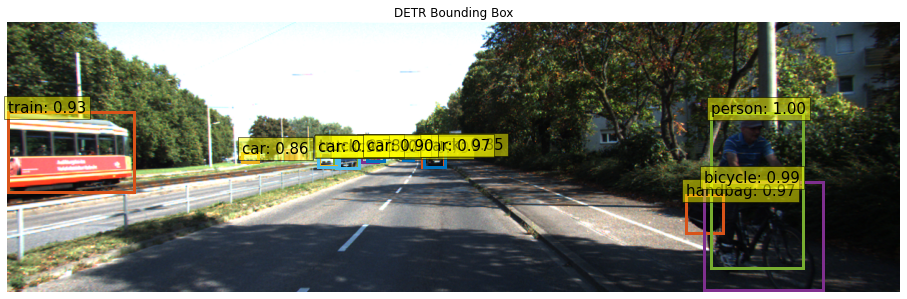

In [25]:
img5 = Image.open(os.path.join('./data/image/train/',train_image_list[1216]))

# DETR 예측값
scores, boxes, shape = detect(img5, detr_101, dpt_transform)

# 시각화 (특정 부분만)
def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.title('DETR Bounding Box')
    plt.show()
    
plot_results(img5, scores, boxes)

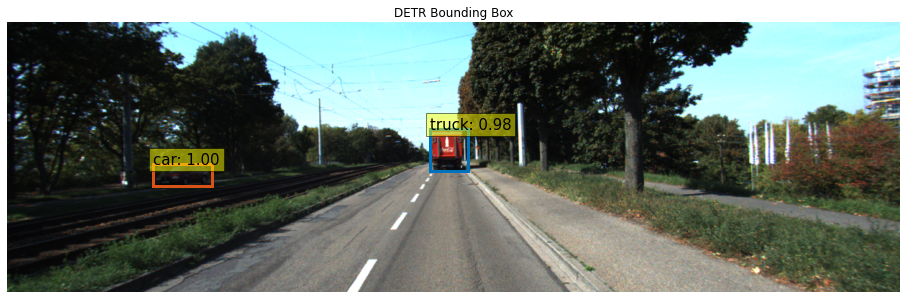

In [26]:
img6 = Image.open(os.path.join('./data/image/train/',train_image_list[1212]))

# DETR 예측값
scores, boxes, shape = detect(img6, detr_101, dpt_transform)

# 시각화 (특정 부분만)
def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.title('DETR Bounding Box')
    plt.show()
    
plot_results(img6, scores, boxes)

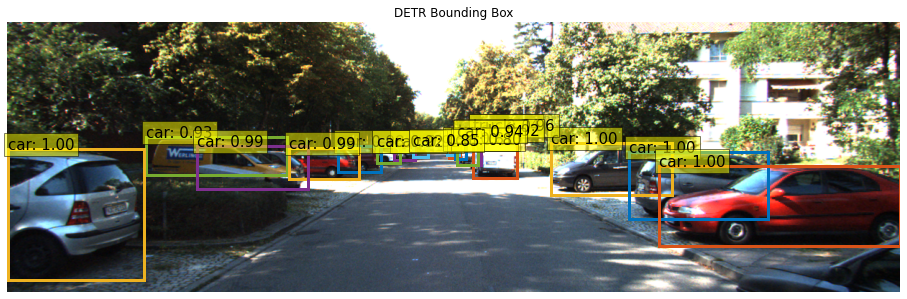

In [27]:
img7 = Image.open(os.path.join('./data/image/train/',train_image_list[1246]))

# DETR 예측값
scores, boxes, shape = detect(img7, detr_101, dpt_transform)

# 시각화 (특정 부분만)
def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.title('DETR Bounding Box')
    plt.show()
    
plot_results(img7, scores, boxes)

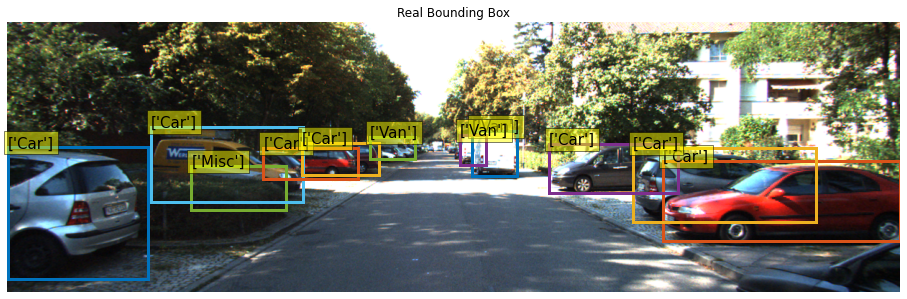

In [28]:
df_choose = df.loc[df.filename==train_image_list[1246]]
class_list = df_choose[['class']].values
coordinates = df_choose[['xmin','ymin','xmax','ymax']].values


# 시각화 (특정 부분만)
def plot_results0(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        #cl = p.argmax()
        text = p
        ax.text(xmin, ymin, p, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.title('Real Bounding Box')
    plt.show()

plot_results0(img7, class_list, coordinates)

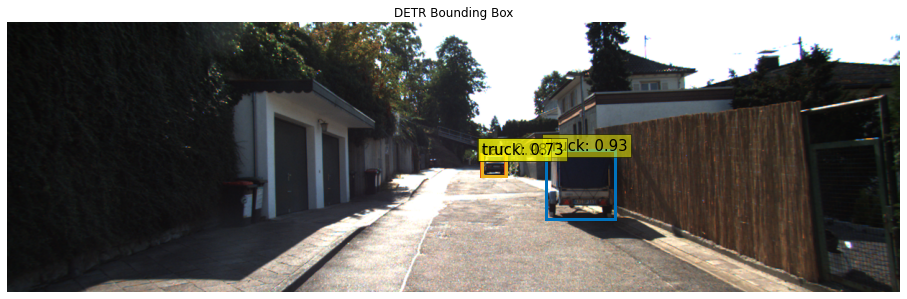

In [29]:
img8 = Image.open(os.path.join('./data/image/train/',train_image_list[1235]))

# DETR 예측값
scores, boxes, shape = detect(img8, detr_101, dpt_transform)

# 시각화 (특정 부분만)
def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.title('DETR Bounding Box')
    plt.show()
    
plot_results(img8, scores, boxes)

In [30]:
# label을 COCO dataset과 동일하게 맞추기
df['class'].replace({'Cyclist':'bicycle','Car':'car','Van':'car','Tram':'train','Person_sitting':'person','Pedestrian':'person','Truck':'truck'}, inplace=True)

In [31]:
df['class'].unique()

array(['person', 'truck', 'car', 'bicycle', 'Misc', 'train'], dtype=object)

#### Monocycle == bicycle로 판단
#### 나머지는 Misc로 대체

1. Depth information, xmin, ymin, xmax, ymax  
2. ymax 좌표가 클수록 이미지가 가깝다? => 4개의 카테고리로 나눈 새로운 변수?  
3. 과연 좌표의 값만으로 비교가 가능할까? xmax-xmin & ymax-ymin 변수가 필요하지 않을까?  
4. Depth information을 max()와 mean()으로 2개의 값 저장하자.  

In [32]:
# 프레임 워크 설명

# Image ->  DETR(Object Detection) -> GPLP(DPT...)(Depth map) -> Predict

#### DETR
https://github.com/facebookresearch/detr  
https://paperswithcode.com/sota/object-detection-on-coco-minival (Rank 66)  

#### GLPN
https://github.com/vinvino02/GLPDepth  
https://paperswithcode.com/sota/monocular-depth-estimation-on-kitti-eigen?p=global-local-path-networks-for-monocular (Rank 3)  

In [33]:
# csv파일이 제공해주는 bounding box와 DETR로 추출한 이미지의 bounding box를 비교해보자.

In [34]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

# label에 맞게 DETR로 Object Detection 진행해서 새로운 .csv 파일 만들기
# 테스트용 -> 추후에 전부 다 실행

In [35]:
df.head(10)

,filename,class,truncated,occluded,observation angle,xmin,ymin,xmax,ymax,height,width,length,xloc,yloc,zloc,rot_y
0,000000.png,person,0.0,0,-0.20,712.40,143.00,810.73,307.92,1.89,0.48,1.20,1.84,1.47,8.41,0.01
1,000001.png,truck,0.0,0,-1.57,599.41,156.40,629.75,189.25,2.85,2.63,12.34,0.47,1.49,69.44,-1.56
2,000001.png,car,0.0,0,1.85,387.63,181.54,423.81,203.12,1.67,1.87,3.69,-16.53,2.39,58.49,1.57
3,000001.png,bicycle,0.0,3,-1.65,676.60,163.95,688.98,193.93,1.86,0.60,2.02,4.59,1.32,45.84,-1.55
4,000002.png,Misc,0.0,0,-1.82,804.79,167.34,995.43,327.94,1.63,1.48,2.37,3.23,1.59,8.55,-1.47
5,000002.png,car,0.0,0,-1.67,657.39,190.13,700.07,223.39,1.41,1.58,4.36,3.18,2.27,34.38,-1.58
6,000003.png,car,0.0,0,1.55,614.24,181.78,727.31,284.77,1.57,1.73,4.15,1.00,1.75,13.22,1.62
7,000004.png,car,0.0,0,1.96,280.38,185.10,344.90,215.59,1.49,1.76,4.01,-15.71,2.16,38.26,1.57
8,000004.png,car,0.0,0,1.88,365.14,184.54,406.11,205.20,1.38,1.80,3.41,-15.89,2.23,51.17,1.58
9,000005.png,person,0.0,0,1.94,330.06,178.74,360.77,238.64,1.87,0.96,0.65,-8.50,2.07,23.02,1.59


In [36]:
train_image_list[10]

'000010.png'

In [37]:
mask = df['filename'] == train_image_list[10]
df_choose = df.loc[mask]
df_choose

,filename,class,truncated,occluded,observation angle,xmin,ymin,xmax,ymax,height,width,length,xloc,yloc,zloc,rot_y
27,000010.png,car,0.8,0,-2.09,1013.39,182.46,1241.00,374.00,1.57,1.65,3.35,4.43,1.65,5.20,-1.42
28,000010.png,car,0.0,0,1.95,354.43,185.52,549.52,294.49,1.43,1.70,3.95,-2.39,1.66,11.80,1.76
29,000010.png,person,0.0,2,1.41,859.54,159.80,879.68,221.40,1.96,0.72,1.09,8.33,1.55,23.51,1.75
30,000010.png,car,0.0,0,-1.78,819.63,178.12,926.85,251.56,1.51,1.60,3.24,5.85,1.64,16.50,-1.44
31,000010.png,car,0.0,2,-1.69,800.54,178.06,878.75,230.56,1.45,1.74,4.10,6.87,1.62,22.05,-1.39
32,000010.png,car,0.0,0,1.80,558.55,179.04,635.05,230.61,1.54,1.68,3.79,-0.38,1.76,23.64,1.78
33,000010.png,car,0.0,2,1.77,598.30,178.68,652.25,218.17,1.49,1.52,3.35,0.64,1.74,29.07,1.79
34,000010.png,car,0.0,1,-1.67,784.59,178.04,839.98,220.10,1.53,1.65,4.37,7.88,1.75,28.53,-1.40
35,000010.png,car,0.0,1,1.92,663.74,175.36,707.21,204.15,1.64,1.45,3.48,4.50,1.80,42.85,2.02


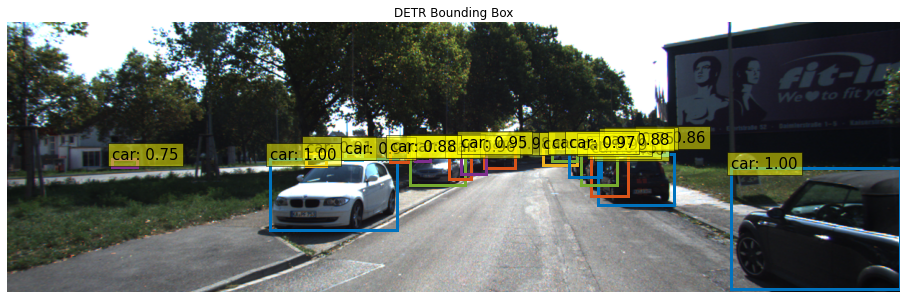

In [38]:
img10 = Image.open(os.path.join('./data/image/train/',train_image_list[10]))

# DETR 예측값
scores, boxes, shape = detect(img10, detr_101, dpt_transform)

# 시각화 (특정 부분만)
def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.title('DETR Bounding Box')
    plt.show()
    
plot_results(img10, scores, boxes)

In [39]:
boxes

tensor([[ 821.9296,  182.2348,  927.4956,  253.8628],
        [ 663.1611,  174.8571,  706.1649,  202.4025],
        [ 415.0553,  180.7240,  443.0447,  199.1731],
        [ 566.1191,  177.7166,  587.9164,  192.8583],
        [ 559.3320,  178.3127,  636.3998,  225.5412],
        [ 469.6924,  181.2277,  493.7556,  191.1801],
        [ 365.2085,  189.6922,  542.3512,  288.0200],
        [ 614.3595,  179.1678,  645.3167,  216.8988],
        [ 744.3378,  173.8593,  792.2554,  198.7317],
        [ 145.3562,  189.8780,  180.4315,  201.4463],
        [ 757.1035,  172.9681,  791.9941,  192.1394],
        [ 878.7629,  166.5985,  918.0184,  183.5777],
        [1007.0435,  202.5234, 1241.9667,  370.8853],
        [ 811.4646,  179.4593,  863.5239,  240.9661],
        [ 835.1713,  167.9142,  861.4994,  179.7761],
        [ 630.9550,  172.9902,  664.8970,  210.0829],
        [ 797.7956,  175.6797,  847.2887,  226.2989],
        [ 828.3835,  168.6832,  856.1105,  180.9369],
        [ 780.6516,  172.561

In [40]:
arg = scores.argmax(axis=1)
print(arg)

tensor([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3])


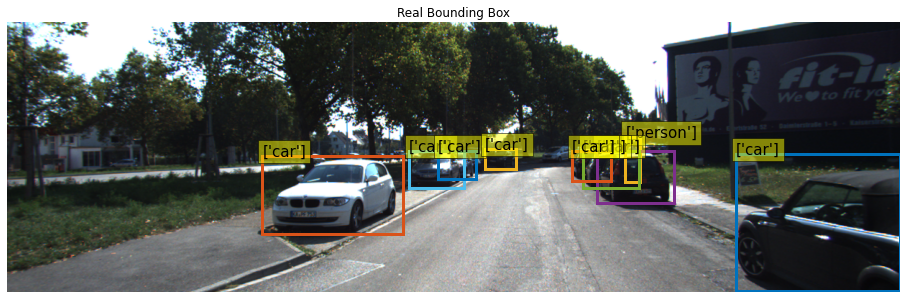

In [41]:
#img2 = Image.open(os.path.join('./data/image/train/',train_image_list[18]))
#df_choose = df.loc[df.filename==train_image_list[18]]
class_list = df_choose[['class']].values
coordinates = df_choose[['xmin','ymin','xmax','ymax']].values

# 시각화 (특정 부분만)
def plot_results0(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        #cl = p.argmax()
        text = p
        ax.text(xmin, ymin, p, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.title('Real Bounding Box')
    plt.show()

plot_results0(img10, class_list, coordinates)

In [42]:
# Depth로 각 bounding box를 비교하면서 max값이 같다면, 같은 위치이지 않을까?

In [43]:
import transformers
print(transformers.__version__) 
from transformers import GLPNForDepthEstimation, GLPNFeatureExtractor

feature_extractor = GLPNFeatureExtractor.from_pretrained("vinvino02/glpn-kitti") # glpn-nyu2
model = GLPNForDepthEstimation.from_pretrained("vinvino02/glpn-kitti")

4.18.0.dev0


In [44]:
model.eval()

GLPNForDepthEstimation(
  (glpn): GLPNModel(
    (encoder): GLPNEncoder(
      (patch_embeddings): ModuleList(
        (0): GLPNOverlapPatchEmbeddings(
          (proj): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
          (layer_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        )
        (1): GLPNOverlapPatchEmbeddings(
          (proj): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        )
        (2): GLPNOverlapPatchEmbeddings(
          (proj): Conv2d(128, 320, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
        )
        (3): GLPNOverlapPatchEmbeddings(
          (proj): Conv2d(320, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
        )
      )
      (block): ModuleList(

In [59]:
img_shape = cv2.imread(os.path.join('./data/image/train/',train_image_list[10])).shape
img_shape

(375, 1242, 3)

In [60]:
with torch.no_grad():
    pixel_values = feature_extractor(img10, return_tensors="pt").pixel_values
    outputs = model(pixel_values) 
    predicted_depth = outputs.predicted_depth
    
    # interpolate to original size
    prediction = torch.nn.functional.interpolate(
                        predicted_depth.unsqueeze(1),
                        size=img_shape[:2],
                        mode="bicubic",
                        align_corners=False,
                 )
    prediction = prediction.squeeze().cpu().numpy()
prediction.shape

(375, 1242)

In [159]:
df_choose

,filename,class,truncated,occluded,observation angle,xmin,ymin,xmax,ymax,height,width,length,xloc,yloc,zloc,rot_y
27,000010.png,car,0.8,0,-2.09,1013.39,182.46,1241.00,374.00,1.57,1.65,3.35,4.43,1.65,5.20,-1.42
28,000010.png,car,0.0,0,1.95,354.43,185.52,549.52,294.49,1.43,1.70,3.95,-2.39,1.66,11.80,1.76
29,000010.png,person,0.0,2,1.41,859.54,159.80,879.68,221.40,1.96,0.72,1.09,8.33,1.55,23.51,1.75
30,000010.png,car,0.0,0,-1.78,819.63,178.12,926.85,251.56,1.51,1.60,3.24,5.85,1.64,16.50,-1.44
31,000010.png,car,0.0,2,-1.69,800.54,178.06,878.75,230.56,1.45,1.74,4.10,6.87,1.62,22.05,-1.39
32,000010.png,car,0.0,0,1.80,558.55,179.04,635.05,230.61,1.54,1.68,3.79,-0.38,1.76,23.64,1.78
33,000010.png,car,0.0,2,1.77,598.30,178.68,652.25,218.17,1.49,1.52,3.35,0.64,1.74,29.07,1.79
34,000010.png,car,0.0,1,-1.67,784.59,178.04,839.98,220.10,1.53,1.65,4.37,7.88,1.75,28.53,-1.40
35,000010.png,car,0.0,1,1.92,663.74,175.36,707.21,204.15,1.64,1.45,3.48,4.50,1.80,42.85,2.02


# 좌표값으로 bounding box 찾기

In [153]:
# 좌표값으로 비교
input_coordinates = []
label = []

count = boxes.shape[0]
for (real_xmin, real_ymin, real_xmax, real_ymax) in coordinates.tolist():
    real_coord_array = np.repeat(np.array((real_xmin, real_ymin, real_xmax, real_ymax)).reshape(1,4), count, axis=0)
    
    result = np.sum(np.square(boxes.detach().numpy() - real_coord_array), axis=1) # 각각의 좌표를 빼서 가장 작은 값 찾기
    index = result.argmin()
    
    input_coordinates.append(boxes[index].detach().numpy())
    label.append(CLASSES[scores[index].argmax()])

input_coordinates = np.array(input_coordinates)
print(input_coordinates)
print(label)

[[1007.04346  202.5234  1241.9667   370.88535]
 [ 365.20853  189.69221  542.3512   288.02002]
 [ 835.17126  167.91417  861.4994   179.77614]
 [ 821.92957  182.23482  927.4956   253.86276]
 [ 811.4646   179.45934  863.52386  240.96608]
 [ 559.33203  178.31271  636.3998   225.54123]
 [ 614.3595   179.16777  645.3167   216.89885]
 [ 797.7956   175.67975  847.2887   226.29889]
 [ 663.16113  174.85712  706.16486  202.40251]]
['car', 'car', 'car', 'car', 'car', 'car', 'car', 'car', 'car']


In [171]:
glp_df = pd.DataFrame({'filename':df_choose['filename'], 'class':label, 'real_class':df_choose['class'], 
                       'xmin':input_coordinates[:,0], 'ymin':input_coordinates[:,1], 'xmax':input_coordinates[:,2], 
                       'ymax':input_coordinates[:,3], 'angle':df_choose['observation angle'], 'zloc':df_choose['zloc']})

# 형식에 맞게 class 조절
for category in glp_df['class']:
    if category not in ['person', 'truck', 'car', 'bicycle', 'Misc', 'train']:
        glp_df['class'].replace({category:'Misc'}, inplace=True)

glp_df = glp_df.loc[glp_df['class']==glp_df['real_class']] # class가 다르면 제외하기
glp_df.reset_index(inplace=True)
glp_df.drop('index',inplace=True,axis=1)
glp_df

,filename,class,real_class,xmin,ymin,xmax,ymax,angle,zloc
0,000010.png,car,car,1007.043457,202.523407,1241.966675,370.885345,-2.09,5.20
1,000010.png,car,car,365.208527,189.692215,542.351196,288.020020,1.95,11.80
2,000010.png,car,car,821.929565,182.234818,927.495605,253.862762,-1.78,16.50
3,000010.png,car,car,811.464600,179.459335,863.523865,240.966080,-1.69,22.05
4,000010.png,car,car,559.332031,178.312714,636.399780,225.541229,1.80,23.64
5,000010.png,car,car,614.359497,179.167770,645.316711,216.898849,1.77,29.07
6,000010.png,car,car,797.795593,175.679749,847.288696,226.298889,-1.67,28.53
7,000010.png,car,car,663.161133,174.857117,706.164856,202.402512,1.92,42.85


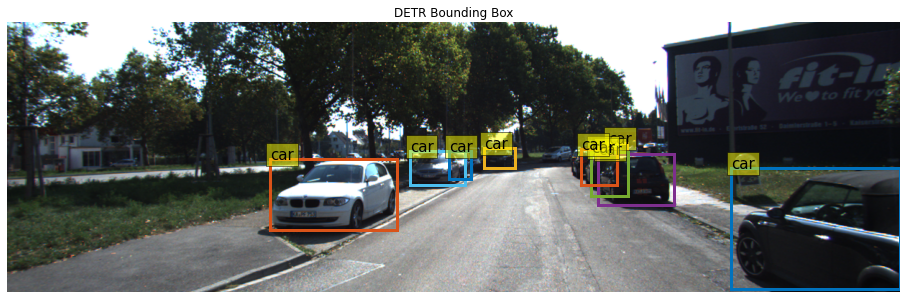

In [172]:
# 시각화 (특정 부분만)
def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes, COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p
        text = p
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.title('DETR Bounding Box')
    plt.show()
    
plot_results(img10, label, input_coordinates)

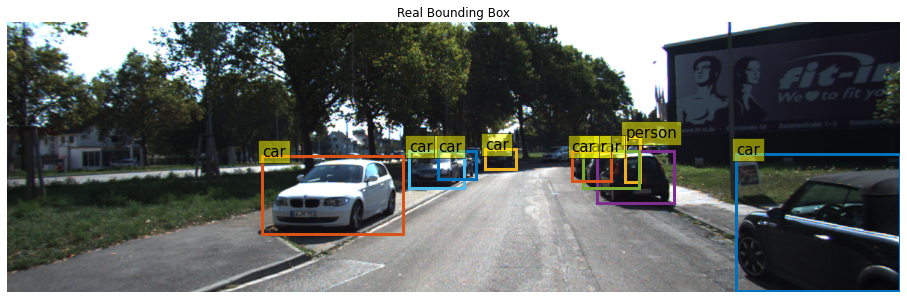

In [170]:
# 시각화 (특정 부분만)
def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p
        text = p
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.title('Real Bounding Box')
    plt.show()
    
plot_results(img10, df_choose['class'], df_choose[['xmin','ymin','xmax','ymax']].values)

# Depth로 서로 일치하는 Bounding box 찾기

In [138]:
# GLPDepth는 value가 작을수록 가까이 있다.
depth_min = []
depth_mean = []
input_coordinates = []
label = []
sub_min = []
correct_index = []

# 실제 데이터
for (real_xmin, real_ymin, real_xmax, real_ymax) in coordinates.tolist():
    real_xmin = int(real_xmin)
    real_ymin = int(real_ymin)
    real_xmax = int(real_xmax)
    real_ymax = int(real_ymax)
    dep_min = prediction[real_ymin:real_ymax+1, real_xmin:real_xmax+1].min()
    sub_min.append(dep_min) # real data의 bounding box에 대한 depth min값 저장
print(sub_min) 
sub_min = np.array(sub_min)

# DETR
index = 0 # Predict 값
for (xmin, ymin, xmax, ymax) in boxes:
    xmin0 = int(xmin)
    ymin0 = int(ymin)
    xmax0 = int(xmax)
    ymax0 = int(ymax)
    dep_min = prediction[ymin0:ymax0+1, xmin0:xmax0+1].min()
    dep_mean = prediction[ymin0:ymax0+1, xmin0:xmax0+1].mean()
    ###############
    dep_median = predict[ymin0:ymax0+1, xmin0:xmax0+1].median()
    
    depth_min.append(dep_min) # DETR로 예측한 bounding box의 depth min값 저장
    depth_mean.append(dep_mean)
    
    print(dep_min)
    correct_depth = np.where(sub_min == dep_min) # dep_max와 동일한 value
    
    if len(correct_depth[0]) == 0:
        #correct_depth = np.where((dep_min - 0.02 <= sub_min) & (sub_min <= dep_min)) # threshold value (유효범위 지정)
        
        if len(correct_depth[0])==0:
            continue
        elif len(correct_depth[0]) > 1:
            continue
        else:
            print(correct_depth[0])
            label.append(CLASSES[scores[index].argmax()]) # 같은 CLASSES로 분류했는지도 확인
            input_coordinates.append([xmin.detach(), ymin.detach(), xmax.detach(), ymax.detach()]) # 데이터와 동일한 곳의 이미지 좌표를 담기 (단, DETR로 예측한 값임)
    else:
        print(correct_depth[0])
        label.append(CLASSES[scores[index].argmax()])
        input_coordinates.append([xmin.detach(), ymin.detach(), xmax.detach(), ymax.detach()]) 
        
    correct_index.append(correct_depth[0][0])
    index += 1

input_coordinates = np.array(input_coordinates)
print(label)
print(input_coordinates)
print(type(input_coordinates))
print(correct_index)

[0.4797062, 1.2764009, 1.8804567, 1.8188074, 1.8817323, 2.7698472, 2.8297014, 1.9573712, 4.9688606]
1.8188074
[3]
4.978601
[8]
1.5078919
2.9647815
2.8199015
1.5531042
1.2764009
[1]
2.8787222
3.5388663
6.71585
3.6045969
1.9477663
0.49730453
[0]
1.8830028
2.9465432
3.3594098
1.8844025
2.5346296
2.238247
5.858192
['car', 'car', 'car', 'car']
[[ 821.92957  182.23482  927.4956   253.86276]
 [ 663.16113  174.85712  706.16486  202.40251]
 [ 365.20853  189.69221  542.3512   288.02002]
 [1007.04346  202.5234  1241.9667   370.88535]]
<class 'numpy.ndarray'>
[3, 8, 1, 0]


In [139]:
csv_index = df_choose.iloc[correct_index]
csv_index

,filename,class,truncated,occluded,observation angle,xmin,ymin,xmax,ymax,height,width,length,xloc,yloc,zloc,rot_y
30,000010.png,car,0.0,0,-1.78,819.63,178.12,926.85,251.56,1.51,1.60,3.24,5.85,1.64,16.50,-1.44
35,000010.png,car,0.0,1,1.92,663.74,175.36,707.21,204.15,1.64,1.45,3.48,4.50,1.80,42.85,2.02
28,000010.png,car,0.0,0,1.95,354.43,185.52,549.52,294.49,1.43,1.70,3.95,-2.39,1.66,11.80,1.76
27,000010.png,car,0.8,0,-2.09,1013.39,182.46,1241.00,374.00,1.57,1.65,3.35,4.43,1.65,5.20,-1.42


In [140]:
# 새로운 데이터 프레임
glp_df = pd.DataFrame({'filename':csv_index['filename'], 'class':label, 'xmin':input_coordinates[:,0],
                      'ymin':input_coordinates[:,1], 'xmax':input_coordinates[:,2], 'ymax':input_coordinates[:,3],
                      'angle':csv_index['observation angle'], 'zloc':csv_index['zloc']})
glp_df.reset_index(inplace=True)
glp_df.drop('index',inplace=True,axis=1)
glp_df

,filename,class,xmin,ymin,xmax,ymax,angle,zloc
0,000010.png,car,821.929565,182.234818,927.495605,253.862762,-1.78,16.50
1,000010.png,car,663.161133,174.857117,706.164856,202.402512,1.92,42.85
2,000010.png,car,365.208527,189.692215,542.351196,288.020020,1.95,11.80
3,000010.png,car,1007.043457,202.523407,1241.966675,370.885345,-2.09,5.20


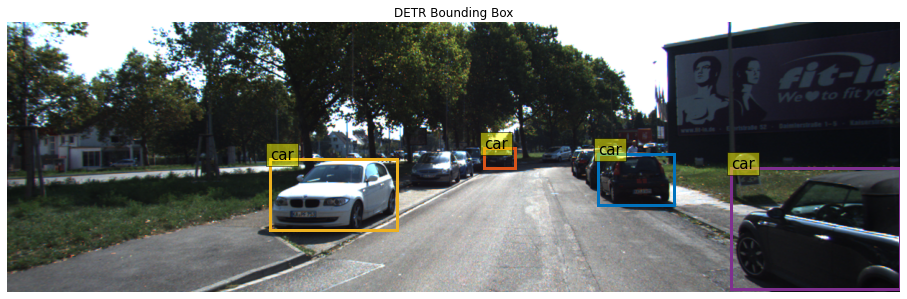

In [141]:
# 시각화 (특정 부분만)
def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes, COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p
        text = p
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.title('DETR Bounding Box')
    plt.show()
    
plot_results(img10, label, input_coordinates)

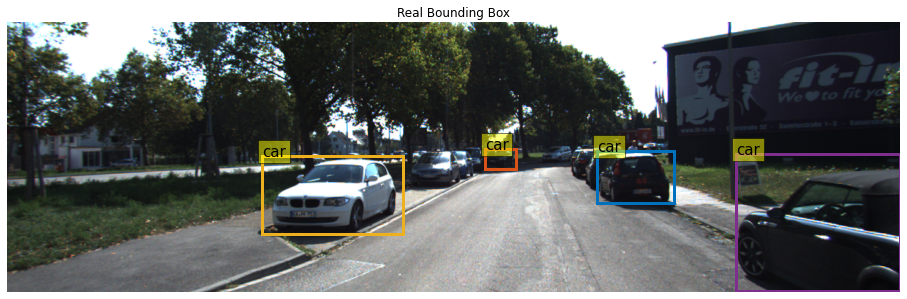

In [142]:
# 시각화 (특정 부분만)
def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p
        text = p
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.title('Real Bounding Box')
    plt.show()
    
plot_results(img10, label, csv_index[['xmin','ymin','xmax','ymax']].values)